In [1]:
import dense_correspondence_manipulation.utils.utils as utils
utils.add_dense_correspondence_to_python_path()
import dense_correspondence
reload(dense_correspondence)
from dense_correspondence.training.training import *
import sys
import logging
import json
import time

#utils.set_default_cuda_visible_devices()
# utils.set_cuda_visible_devices([0]) # use this to manually set CUDA_VISIBLE_DEVICES

import dense_correspondence.dataset.spartan_dataset_masked
reload(dense_correspondence.dataset.spartan_dataset_masked)
import dense_correspondence.training.training
reload(dense_correspondence.training.training)
from dense_correspondence.training.training import DenseCorrespondenceTraining
from dense_correspondence.dataset.spartan_dataset_masked import SpartanDataset, OPDataSelector
logging.basicConfig(level=logging.INFO)

import dense_correspondence.evaluation.evaluation
reload(dense_correspondence.evaluation.evaluation)
from dense_correspondence.evaluation.evaluation import DenseCorrespondenceEvaluation

# Multi Object Pursuit
utils.add_object_pursuit_to_python_path()
import object_pursuit
reload(object_pursuit)
from dense_correspondence.training.op_training import OPMultiDenseCorrespondenceTraining


cuda = torch.cuda.is_available()
DEVICE = "cuda:1" if cuda else "cpu"
if cuda:
    print("CUDA GPU!")
else:
    print("CPU!")

CUDA GPU!


## Load the configuration for training

In [2]:
# Dataset
verbose = False
config_filename = os.path.join(utils.getDenseCorrespondenceSourceDir(), 'config', 'dense_correspondence', 
                               'dataset', 'composite', 'op_pretraining.yaml')
data_config = utils.getDictFromYamlFilename(config_filename)
data_config['logs_root_path'] = '/home/ashek/code/data/pdc/logs_proto'

# Training
train_config_file = os.path.join(utils.getDenseCorrespondenceSourceDir(), 'config', 'dense_correspondence', 
                               'training', 'training.yaml')
train_config = utils.getDictFromYamlFilename(train_config_file)
train_config['device'] = DEVICE
train_config['dense_correspondence_network']['device'] = DEVICE

logging_dir = "/home/ashek/code/data/pdc/trained_models/tutorials"
num_iterations = 3500
d = 3 # the descriptor dimension
datetime_str = time.strftime('%Y_%m_%d_%H:%M:%S', time.localtime())
name = "op_multinet_pretraining_" + datetime_str
train_config["training"]["logging_dir_name"] = name
train_config["training"]["logging_dir"] = logging_dir
train_config["dense_correspondence_network"]["descriptor_dimension"] = d
train_config["training"]["num_iterations"] = num_iterations
print(json.dumps(train_config, indent=2))

{
  "device": "cuda:1", 
  "training": {
    "data_type_probabilities": {
      "SINGLE_OBJECT_ACROSS_SCENE": 0, 
      "SINGLE_OBJECT_WITHIN_SCENE": 1, 
      "DIFFERENT_OBJECT": 0, 
      "SYNTHETIC_MULTI_OBJECT": 0, 
      "MULTI_OBJECT": 0
    }, 
    "num_test_imgs_per_scene": 1, 
    "save_rate": 1000, 
    "num_workers": 5, 
    "logging_dir": "/home/ashek/code/data/pdc/trained_models/tutorials", 
    "compute_test_loss": true, 
    "sample_matches_only_off_mask": true, 
    "fraction_masked_non_matches": 0.5, 
    "batch_size": 1, 
    "domain_randomize": true, 
    "num_matching_attempts": 10000, 
    "weight_decay": 0.0001, 
    "learning_rate_decay": 0.9, 
    "compute_test_loss_rate": 500, 
    "num_non_matches_per_match": 150, 
    "num_iterations": 3500, 
    "steps_between_learning_rate_decay": 250, 
    "cross_scene_num_samples": 10000, 
    "logging_dir_name": "op_multinet_pretraining_2022_05_13_16:34:56", 
    "loss_function": "pixelwise_contrastive_loss", 
    "fract

## Train the network

This should take about ~12-15 minutes with a GTX 1080 Ti

In [3]:
# dataset.get_pose_data(dataset.get_scene_list()[0])
data_config

{'logs_root_path': '/home/ashek/code/data/pdc/logs_proto',
 'multi_object_scenes_config_files': [],
 'single_object_scenes_config_files': ['10_drill_scenes.yaml',
  'caterpillar_upright.yaml',
  'dramamine.yaml',
  'gopro_box.yaml',
  'headphones.yaml']}

['device', 'training', 'dense_correspondence_network', 'loss_function']
training descriptor of dimension 3
Using SpartanDataset:
   - in train mode
   - number of scenes 40
   - total images:     12869
DATASET MODE: train
Using SpartanDataset:
   - in test mode
   - number of scenes 11
   - total images:     3904
DATASET MODE: test
using SINGLE_OBJECT_WITHIN_SCENE
using SINGLE_OBJECT_WITHIN_SCENE
using SINGLE_OBJECT_WITHIN_SCENE
using SINGLE_OBJECT_WITHIN_SCENE
('dir_name: ', 'op_multinet_pretraining_2022_05_13_16:34:56')
('logging_dir:', '/home/ashek/code/data/pdc/trained_models/tutorials/op_multinet_pretraining_2022_05_13_16:34:56')
['normalize', 'descriptor_dimension', 'image_height', 'device', 'backbone', 'image_width', 'OP']
('load pretrained model: ', 'resnet_18')


  0%|          | 1/3500 [00:00<33:26,  1.74it/s]WARNING:root:Limited tf.compat.v2.summary API due to missing TensorBoard installation.




-----------Test Data Evaluation on caterpillar----------------
Image pair (355, 1540)


/home/ashek/code/dense_correspondence/network/op_dense_correspondence_network.py:162: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.tensor(img_tensor, device=self.device)


Could not find descriptor image stats...
Only normalizing pairs of images!


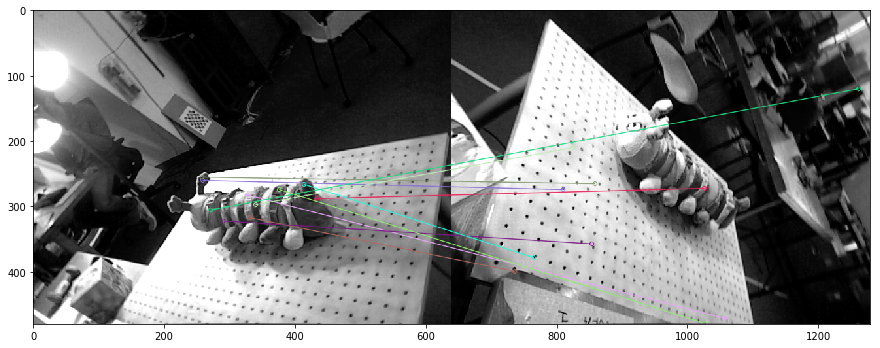

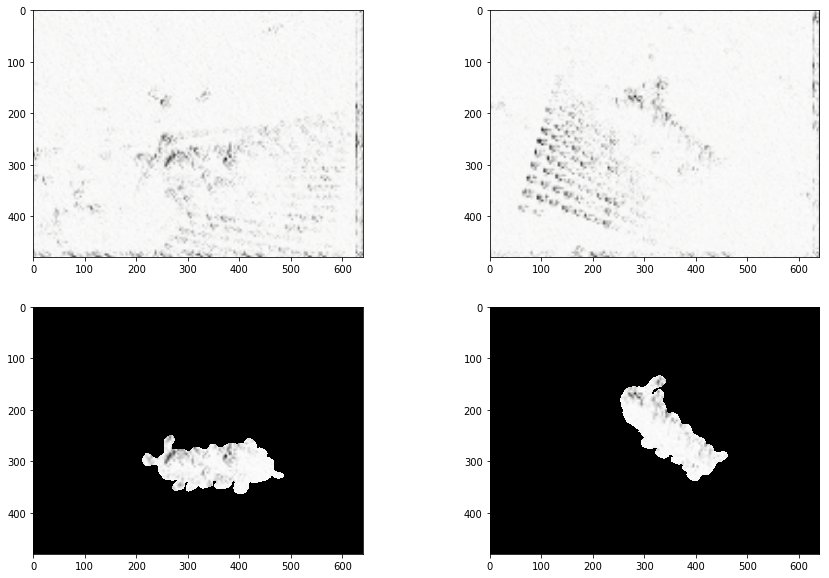



-----------Test Data Evaluation on dramamine----------------
Image pair (746, 183)
Could not find descriptor image stats...
Only normalizing pairs of images!


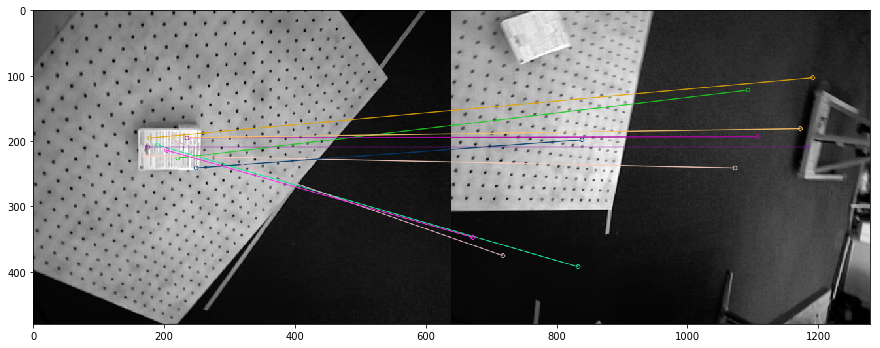

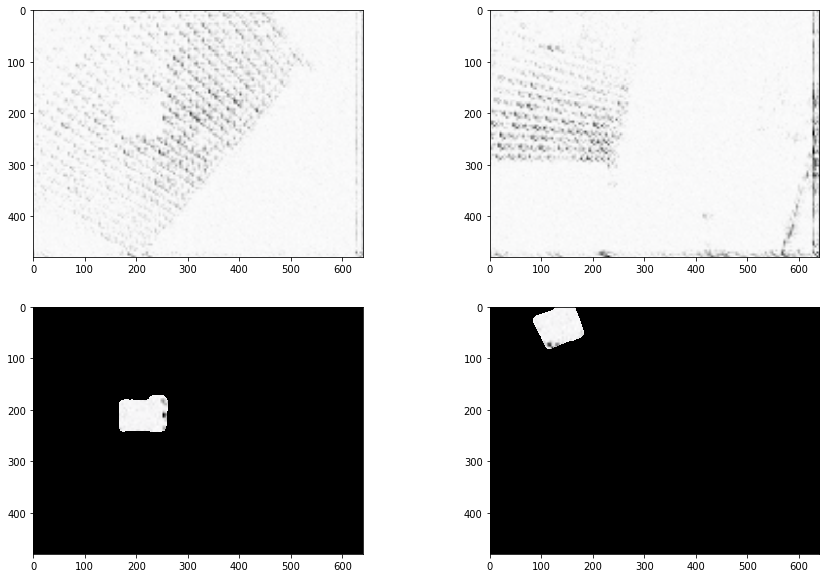



-----------Test Data Evaluation on drill----------------
Image pair (1211, 2452)
Could not find descriptor image stats...
Only normalizing pairs of images!


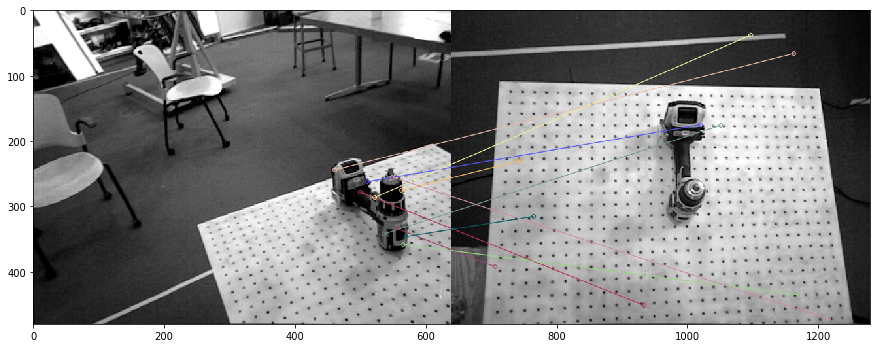

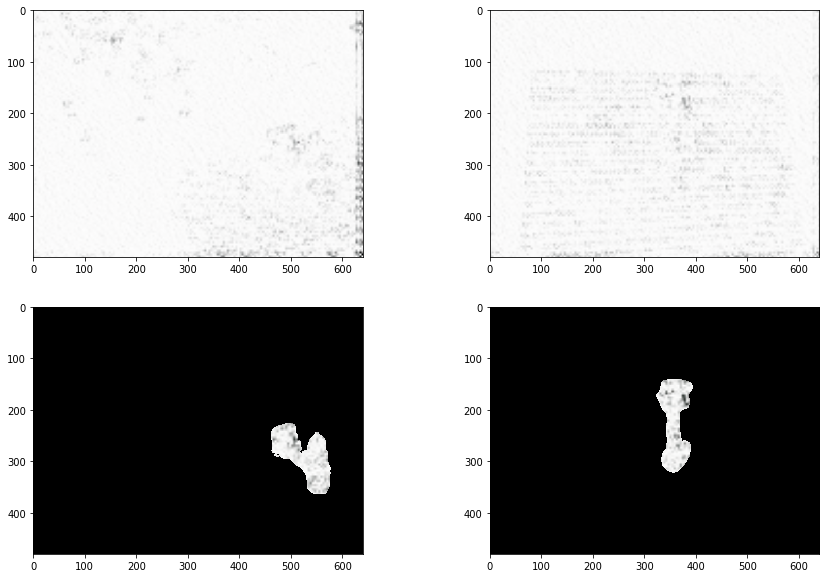



-----------Test Data Evaluation on gopro_box----------------
Image pair (1506, 1399)
Could not find descriptor image stats...
Only normalizing pairs of images!


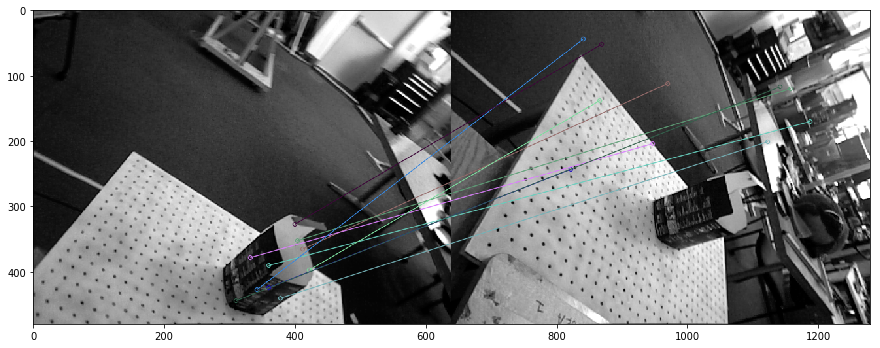

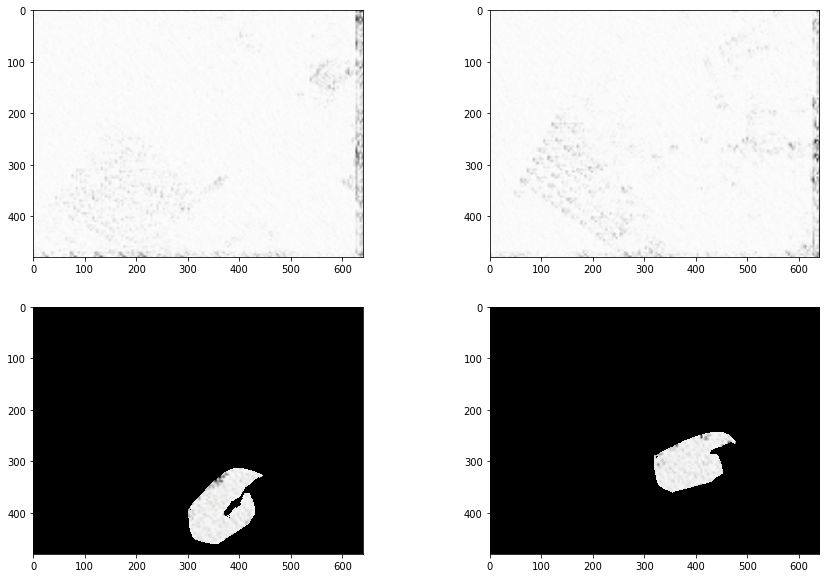



-----------Test Data Evaluation on headphones----------------
Image pair (1959, 1601)
Could not find descriptor image stats...
Only normalizing pairs of images!


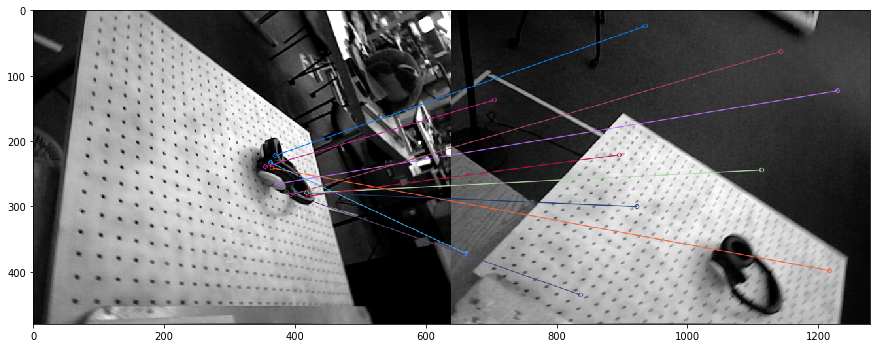

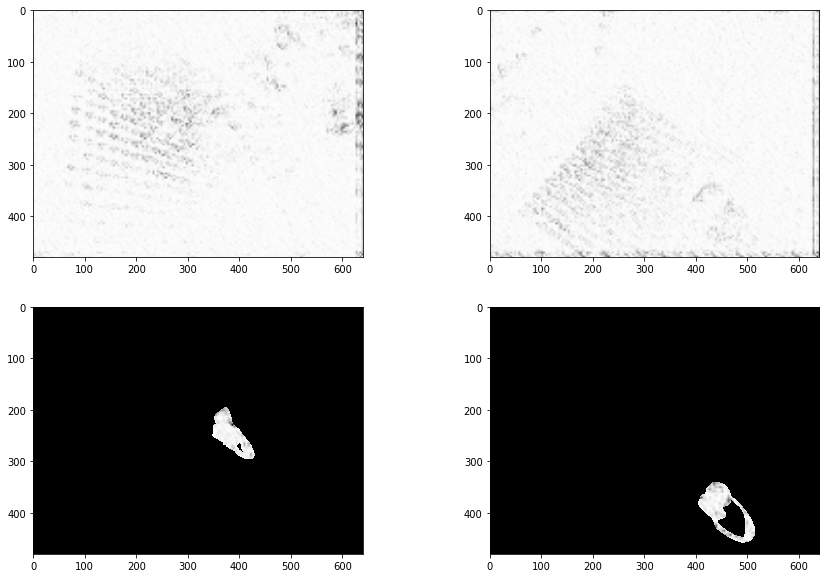

  0%|          | 7/3500 [00:19<1:28:09,  1.51s/it]

warning, empty mask b


  1%|          | 34/3500 [00:39<43:18,  1.33it/s] 


 empty data, continuing 



  1%|          | 37/3500 [00:41<36:27,  1.58it/s]


 empty data, continuing 



  5%|▌         | 183/3500 [02:31<42:37,  1.30it/s]

warning, empty mask b


  8%|▊         | 278/3500 [03:45<41:52,  1.28it/s]


 empty data, continuing 



 12%|█▏        | 437/3500 [05:48<40:13,  1.27it/s]


 empty data, continuing 



 13%|█▎        | 450/3500 [05:57<39:44,  1.28it/s]


 empty data, continuing 



 14%|█▍        | 500/3500 [06:36<39:35,  1.26it/s]



-----------Test Data Evaluation on caterpillar----------------
Image pair (1713, 2036)
Could not find descriptor image stats...
Only normalizing pairs of images!


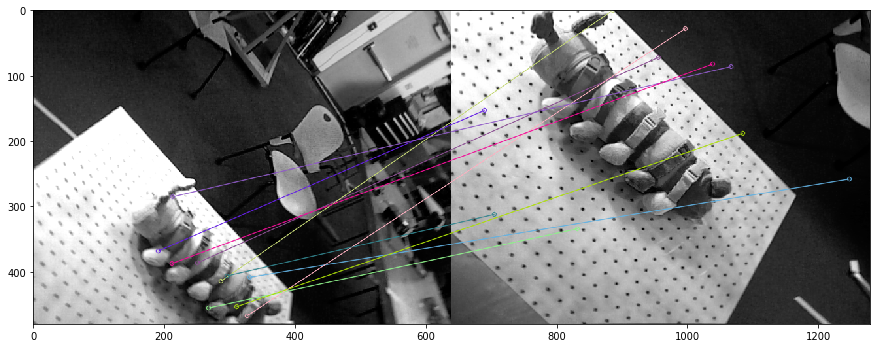

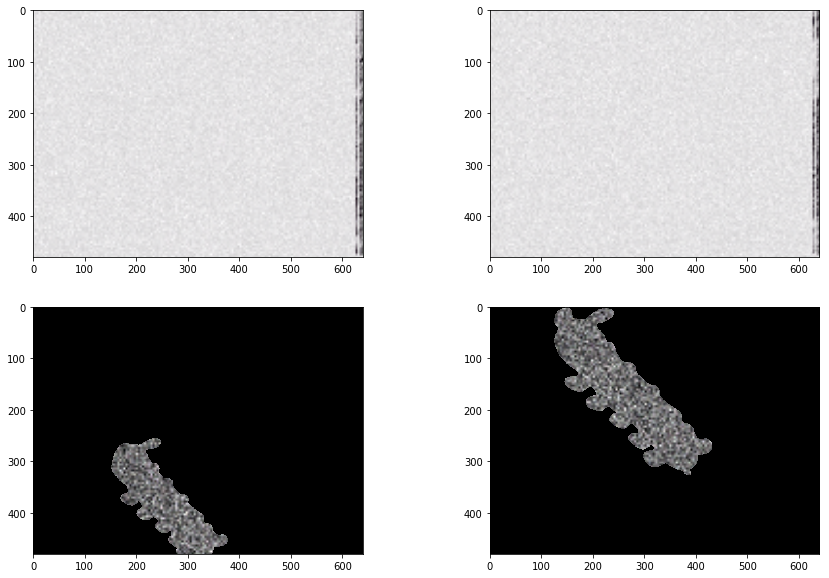



-----------Test Data Evaluation on dramamine----------------
Image pair (1407, 527)
Could not find descriptor image stats...
Only normalizing pairs of images!


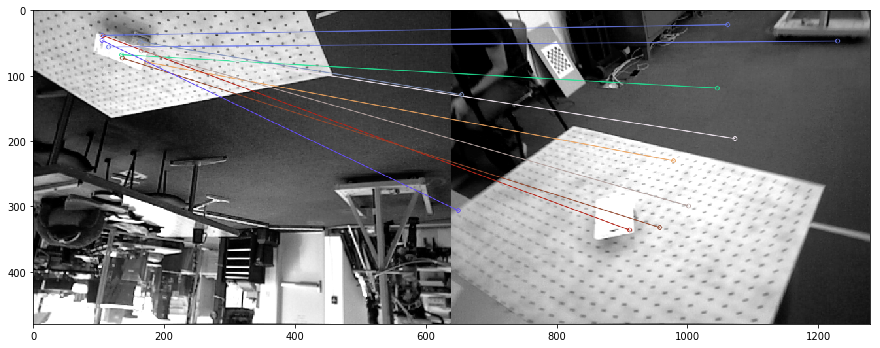

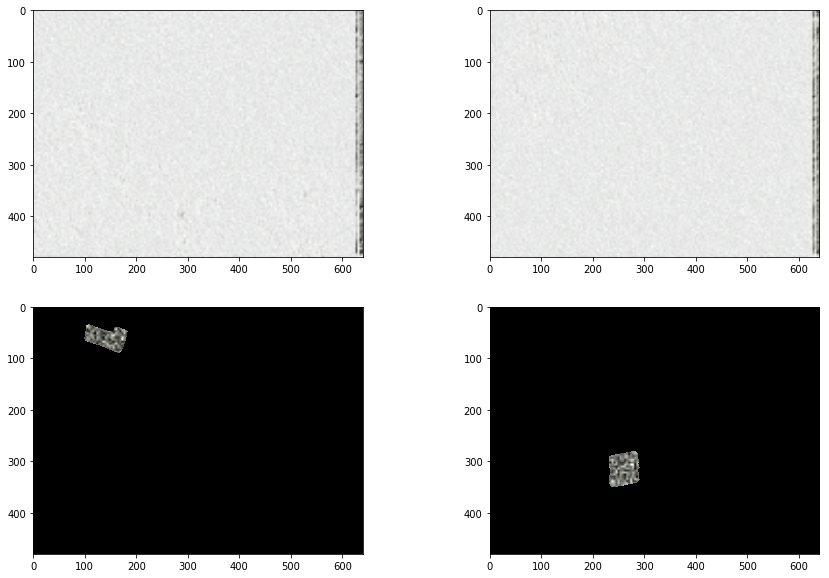



-----------Test Data Evaluation on drill----------------
Image pair (910, 1240)
Could not find descriptor image stats...
Only normalizing pairs of images!


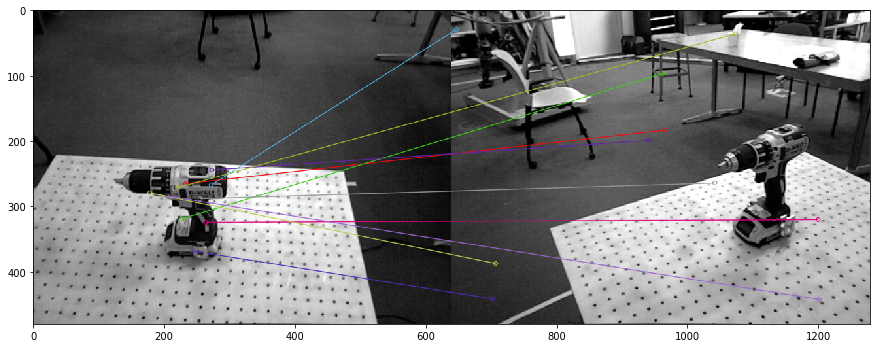

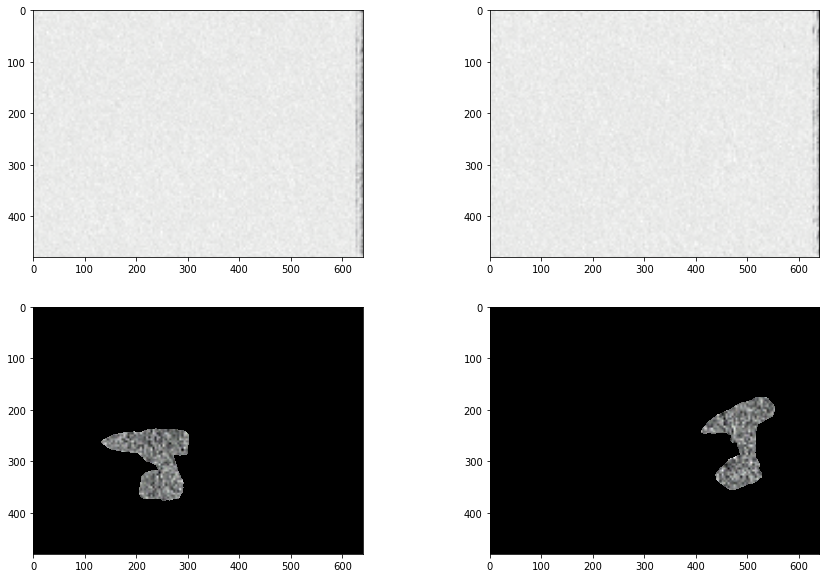



-----------Test Data Evaluation on gopro_box----------------
Image pair (1626, 1151)
Could not find descriptor image stats...
Only normalizing pairs of images!


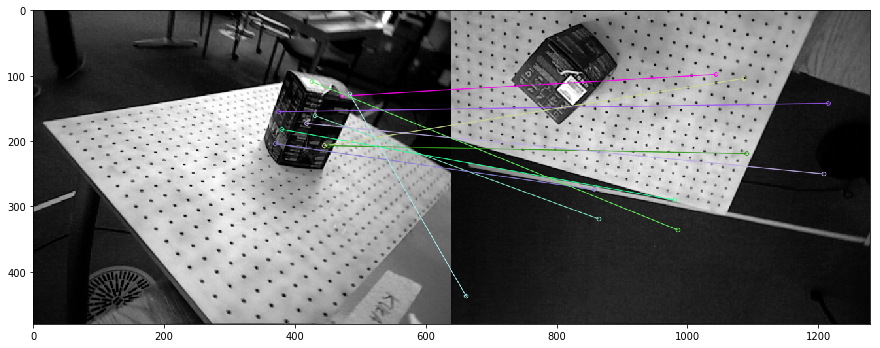

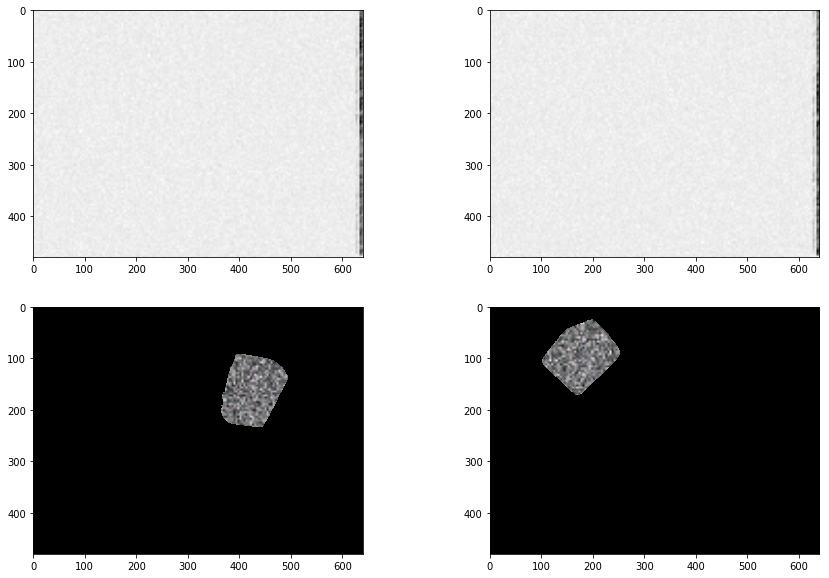



-----------Test Data Evaluation on headphones----------------
Image pair (2202, 1912)
Could not find descriptor image stats...
Only normalizing pairs of images!


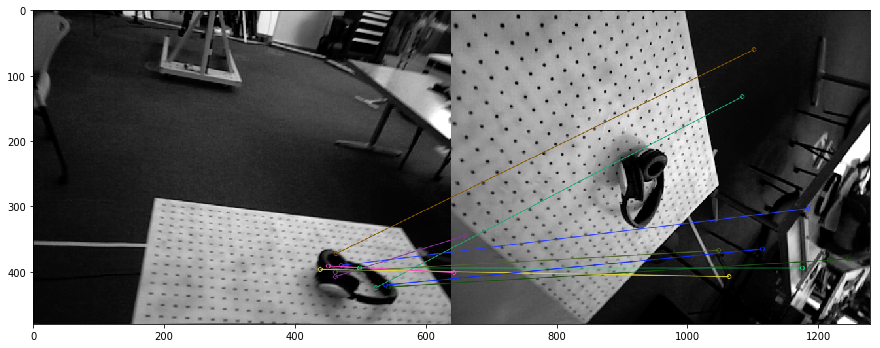

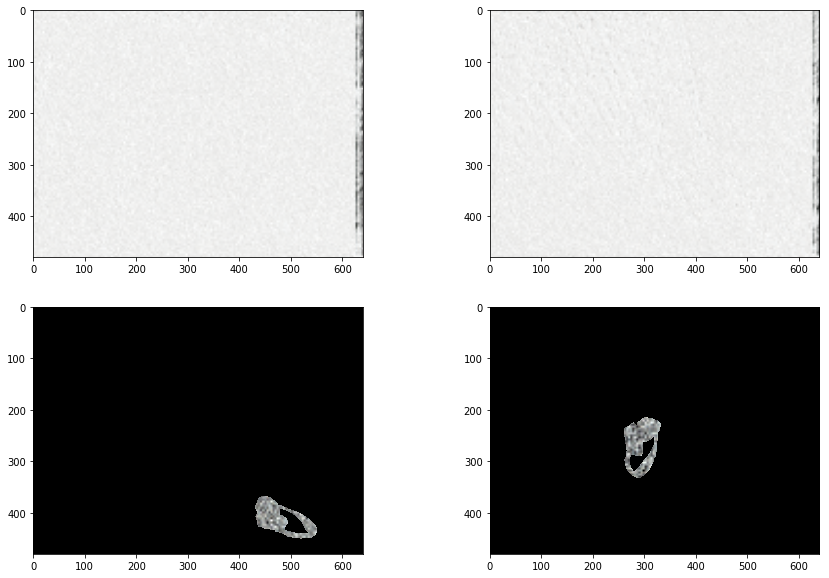

 17%|█▋        | 587/3500 [07:57<39:12,  1.24it/s]  


 empty data, continuing 



 23%|██▎       | 805/3500 [10:47<34:56,  1.29it/s]/home/ashek/code/modules/dense_correspondence_manipulation/utils/utils.py:266: RuntimeWarning: invalid value encountered in arccos
  theta = 2*np.arccos(2 * np.dot(q,r)**2 - 1)
 25%|██▌       | 881/3500 [11:46<33:45,  1.29it/s]


 empty data, continuing 



 27%|██▋       | 937/3500 [12:29<32:57,  1.30it/s]

warning, empty mask b


 29%|██▊       | 1000/3500 [13:18<32:08,  1.30it/s]



-----------Test Data Evaluation on caterpillar----------------
Image pair (1077, 1207)
Could not find descriptor image stats...
Only normalizing pairs of images!


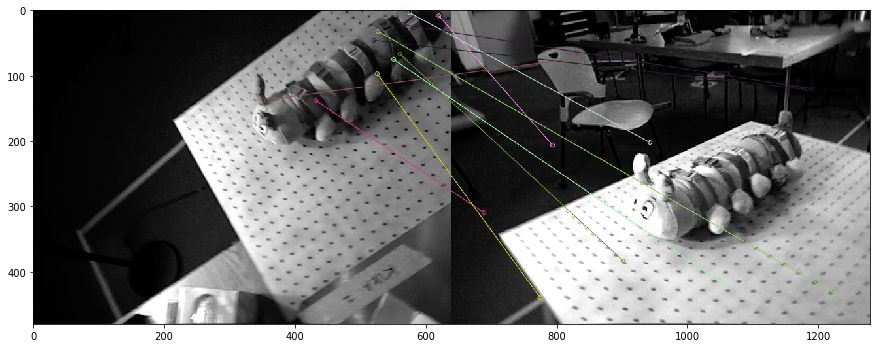

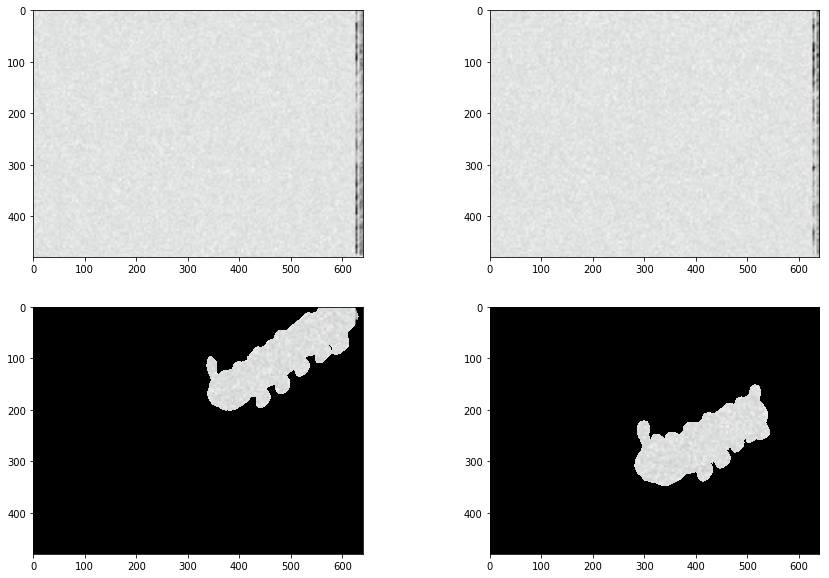



-----------Test Data Evaluation on dramamine----------------
Image pair (260, 1545)
Could not find descriptor image stats...
Only normalizing pairs of images!


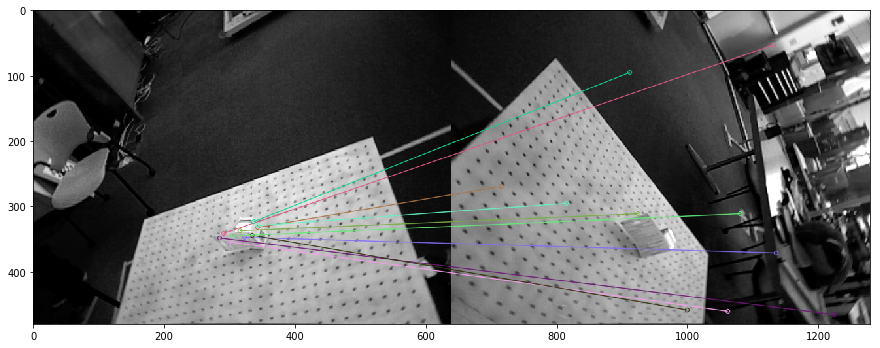

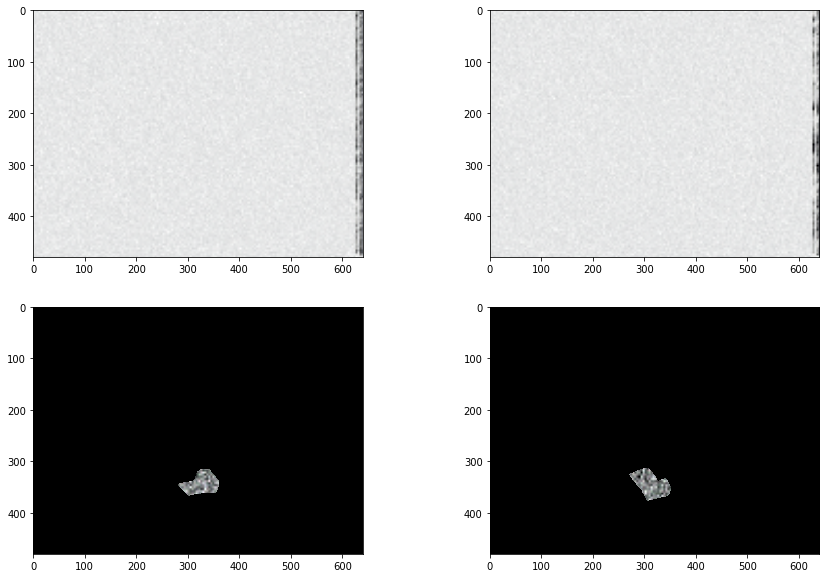



-----------Test Data Evaluation on drill----------------
Image pair (487, 1034)
Could not find descriptor image stats...
Only normalizing pairs of images!


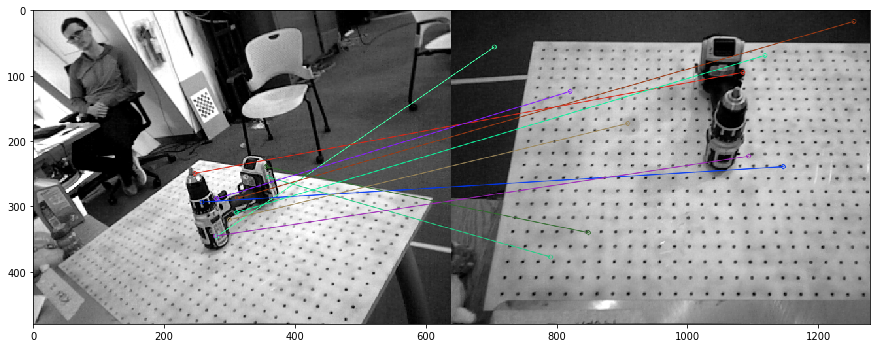

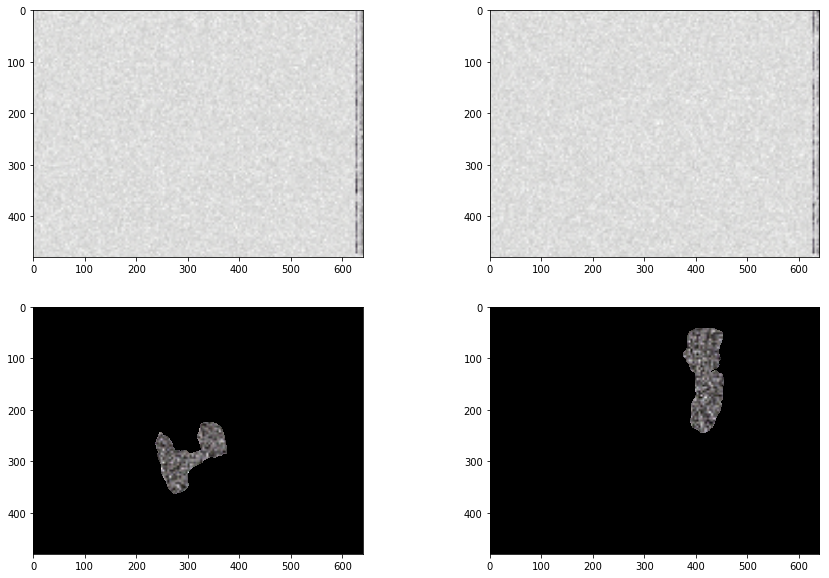



-----------Test Data Evaluation on gopro_box----------------
Image pair (1110, 108)
Could not find descriptor image stats...
Only normalizing pairs of images!


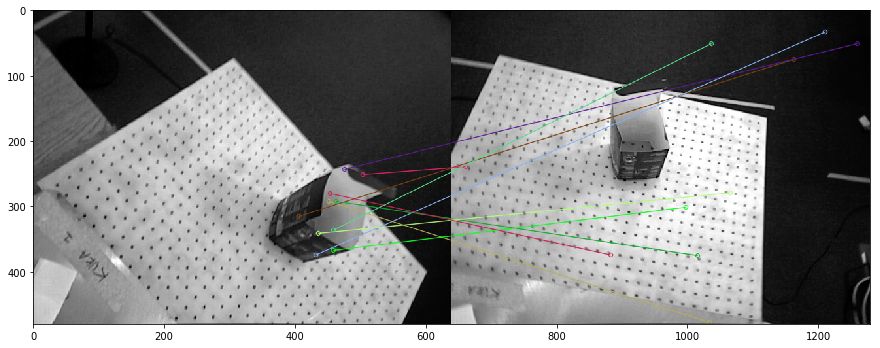

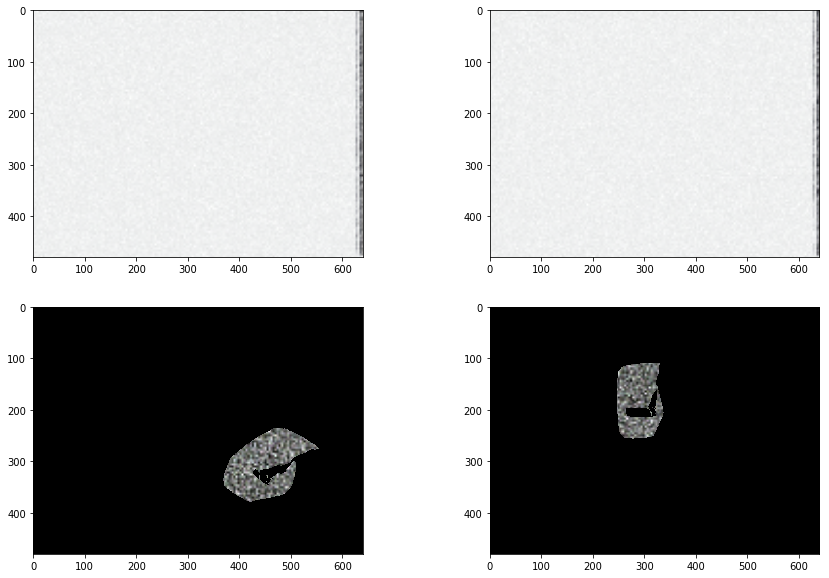



-----------Test Data Evaluation on headphones----------------
Image pair (3511, 52)
Could not find descriptor image stats...
Only normalizing pairs of images!


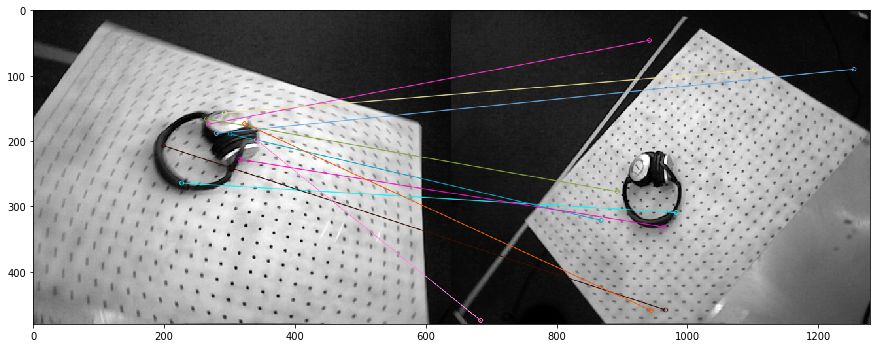

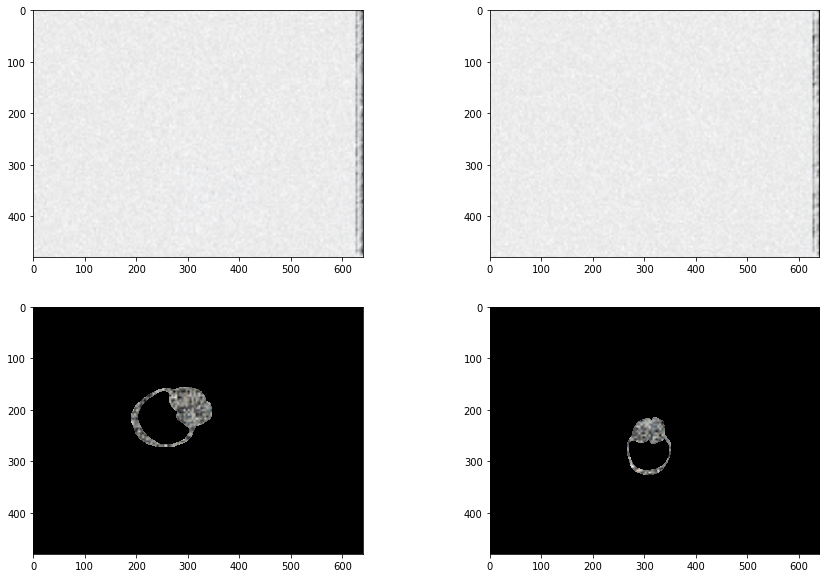

 30%|██▉       | 1038/3500 [14:01<31:46,  1.29it/s]  


 empty data, continuing 



 30%|███       | 1056/3500 [14:14<32:00,  1.27it/s]/home/ashek/code/modules/dense_correspondence_manipulation/utils/utils.py:266: RuntimeWarning: invalid value encountered in arccos
  theta = 2*np.arccos(2 * np.dot(q,r)**2 - 1)
 40%|███▉      | 1387/3500 [18:34<26:54,  1.31it/s]


 empty data, continuing 



 40%|████      | 1401/3500 [18:44<26:46,  1.31it/s]

warning, empty mask b


 43%|████▎     | 1500/3500 [20:02<25:47,  1.29it/s]



-----------Test Data Evaluation on caterpillar----------------
Image pair (1811, 115)
Could not find descriptor image stats...
Only normalizing pairs of images!


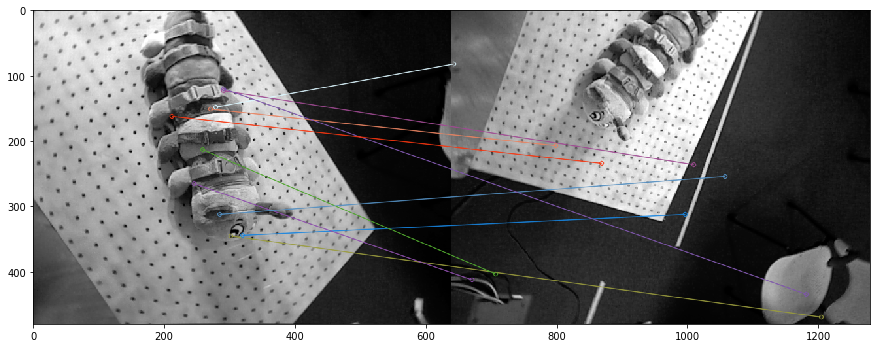

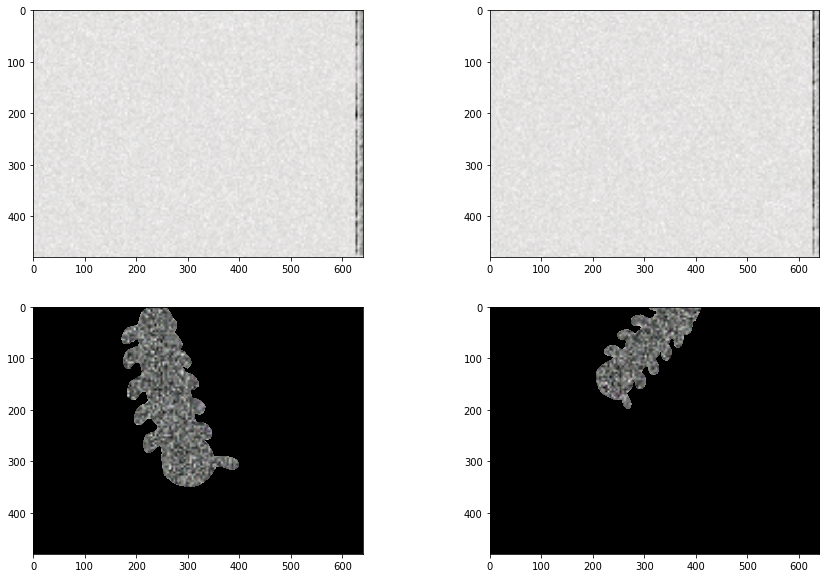



-----------Test Data Evaluation on dramamine----------------
Image pair (1531, 315)
Could not find descriptor image stats...
Only normalizing pairs of images!


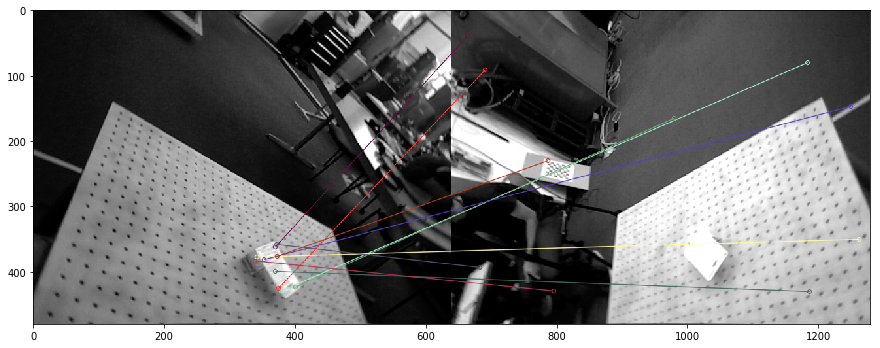

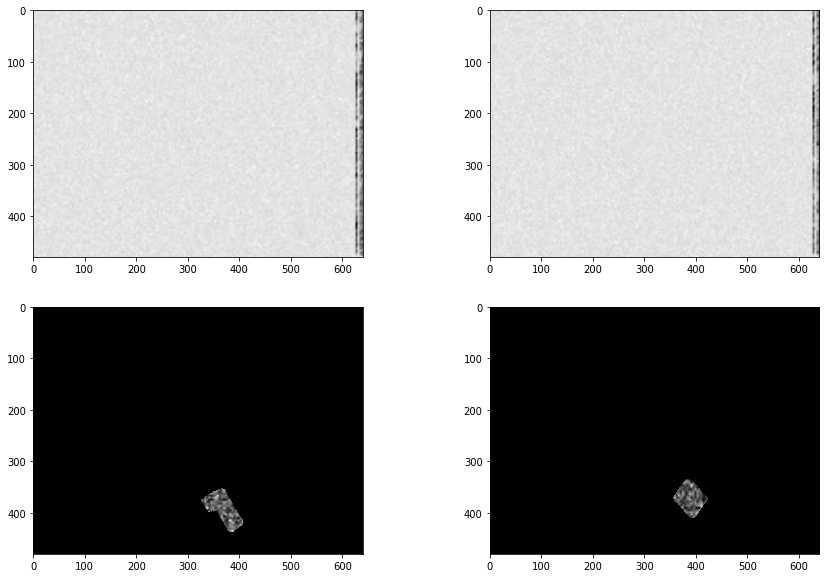



-----------Test Data Evaluation on drill----------------
Image pair (1192, 1482)
Could not find descriptor image stats...
Only normalizing pairs of images!


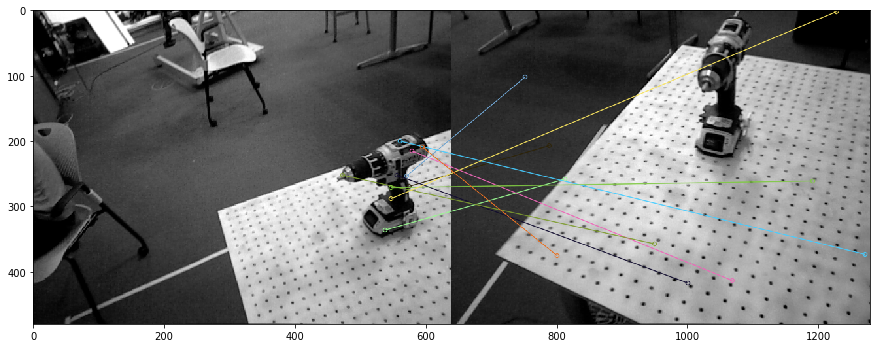

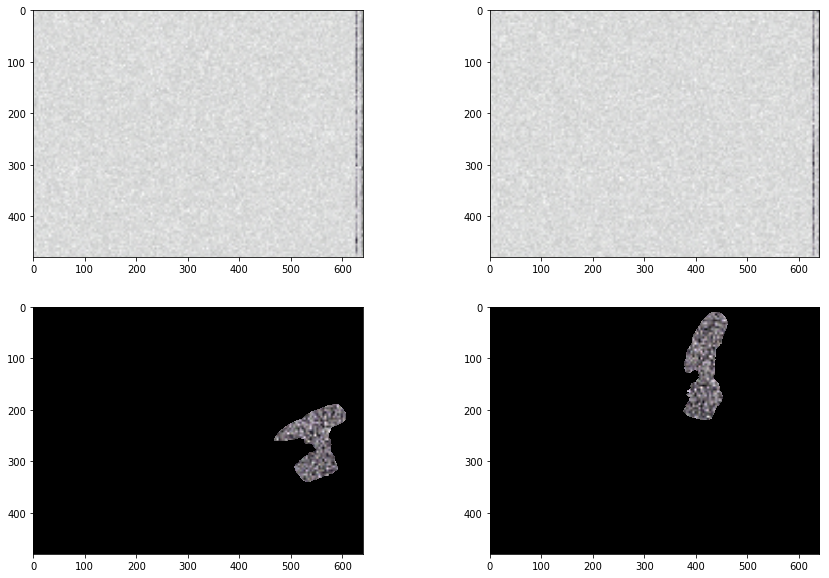



-----------Test Data Evaluation on gopro_box----------------
Image pair (502, 1061)
Could not find descriptor image stats...
Only normalizing pairs of images!


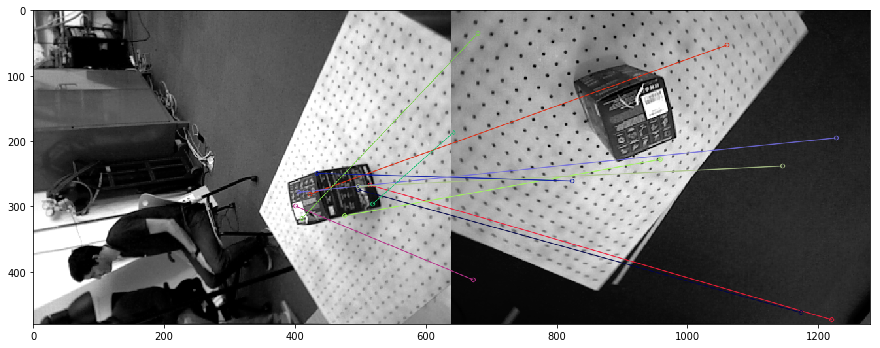

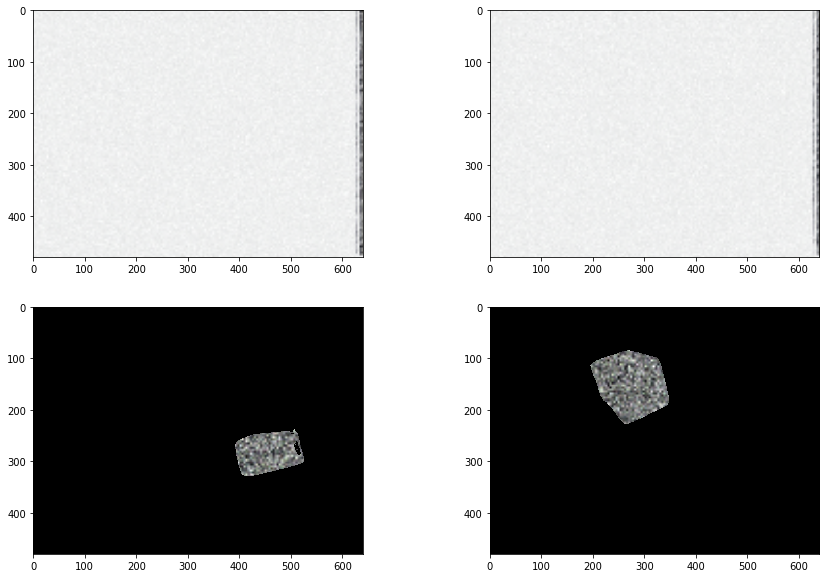



-----------Test Data Evaluation on headphones----------------
Image pair (1844, 2595)
Could not find descriptor image stats...
Only normalizing pairs of images!


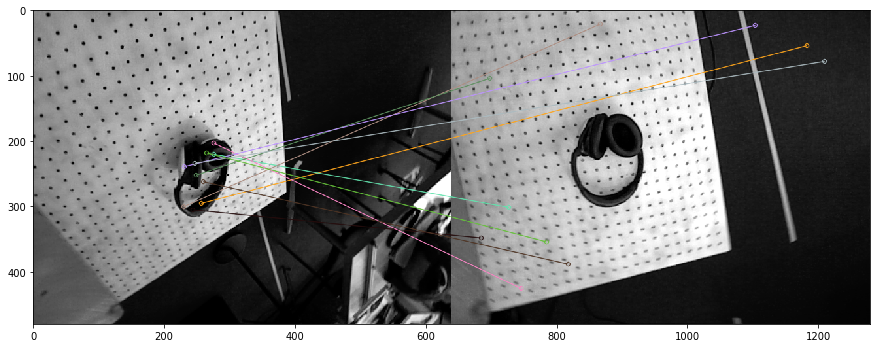

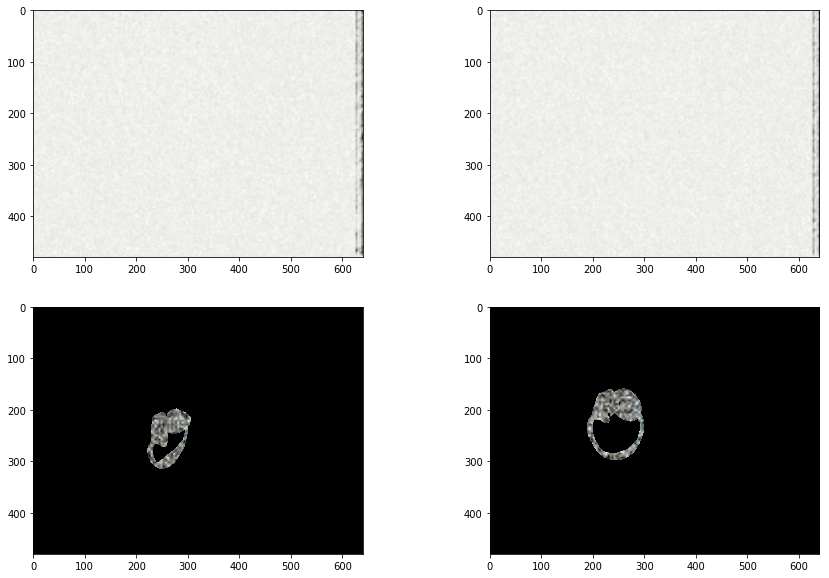

 44%|████▎     | 1523/3500 [20:32<25:12,  1.31it/s]  


 empty data, continuing 



 45%|████▍     | 1561/3500 [21:01<25:27,  1.27it/s]


 empty data, continuing 



 47%|████▋     | 1628/3500 [21:53<24:13,  1.29it/s]/home/ashek/code/modules/dense_correspondence_manipulation/utils/utils.py:266: RuntimeWarning: invalid value encountered in arccos
  theta = 2*np.arccos(2 * np.dot(q,r)**2 - 1)
 47%|████▋     | 1633/3500 [21:57<24:34,  1.27it/s]


 empty data, continuing 



 52%|█████▏    | 1806/3500 [24:12<22:03,  1.28it/s]


 empty data, continuing 



 52%|█████▏    | 1834/3500 [24:33<21:41,  1.28it/s]

warning, empty mask b


 53%|█████▎    | 1859/3500 [24:53<20:57,  1.31it/s]


 empty data, continuing 



 57%|█████▋    | 2000/3500 [26:42<18:45,  1.33it/s]



-----------Test Data Evaluation on caterpillar----------------
Image pair (1349, 128)
Could not find descriptor image stats...
Only normalizing pairs of images!


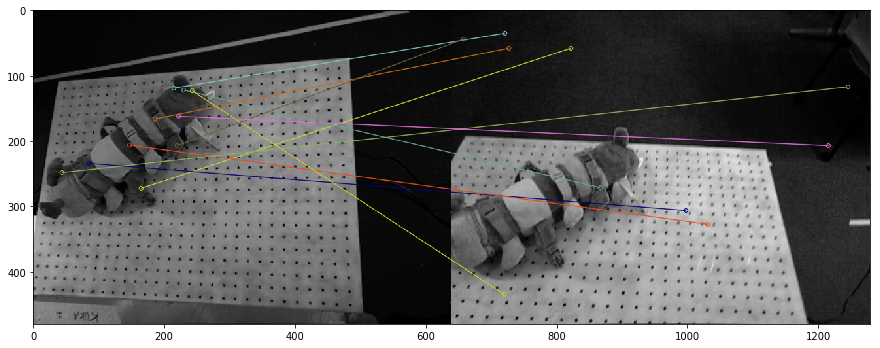

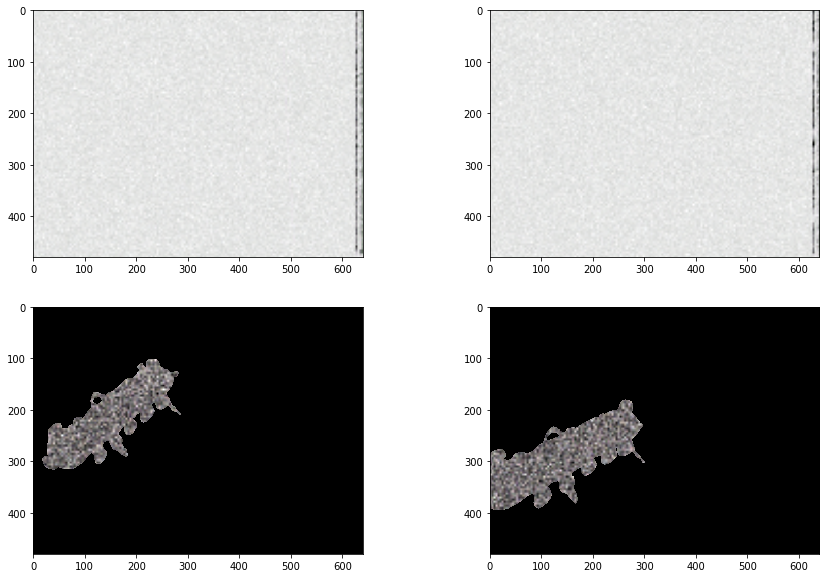



-----------Test Data Evaluation on dramamine----------------
Image pair (1056, 810)
Could not find descriptor image stats...
Only normalizing pairs of images!


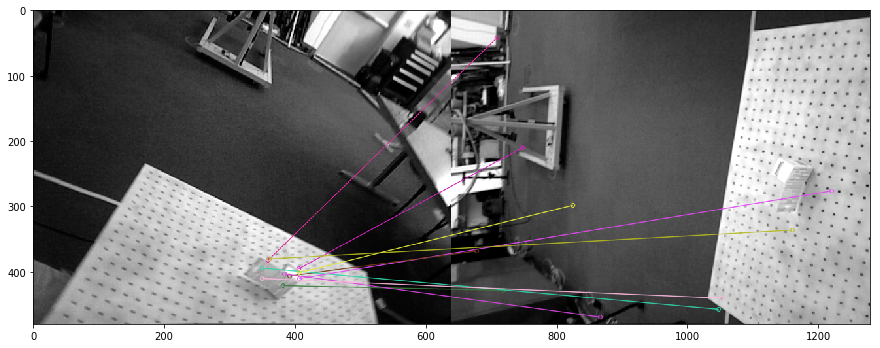

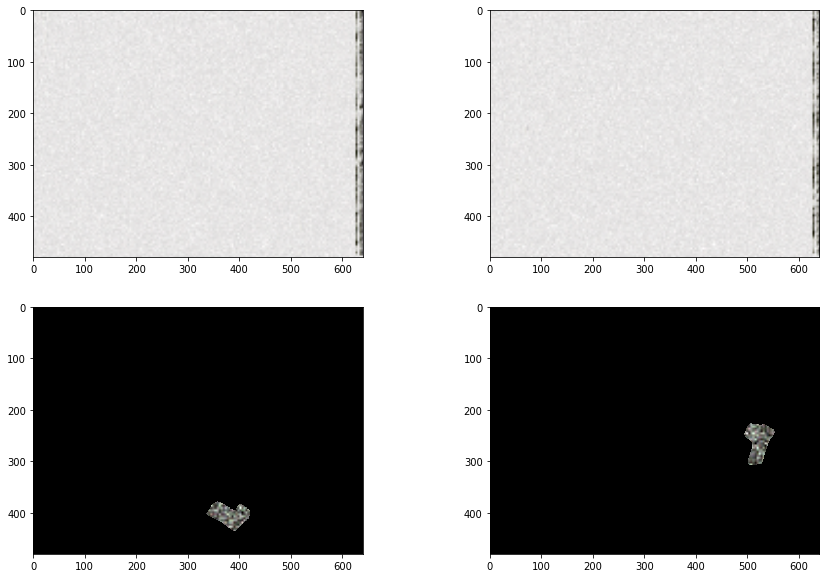



-----------Test Data Evaluation on drill----------------
Image pair (211, 1839)
Could not find descriptor image stats...
Only normalizing pairs of images!


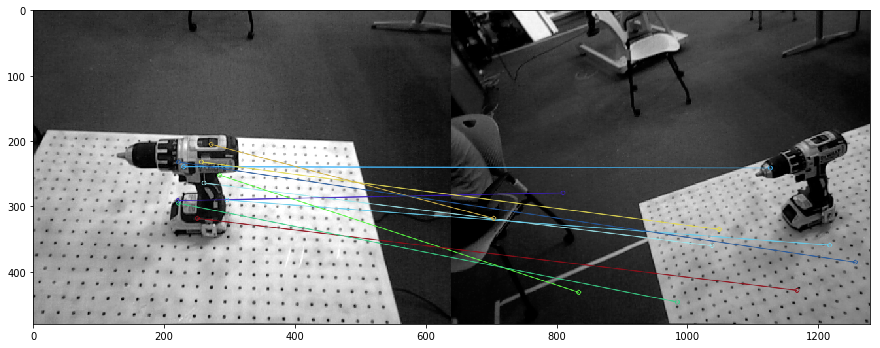

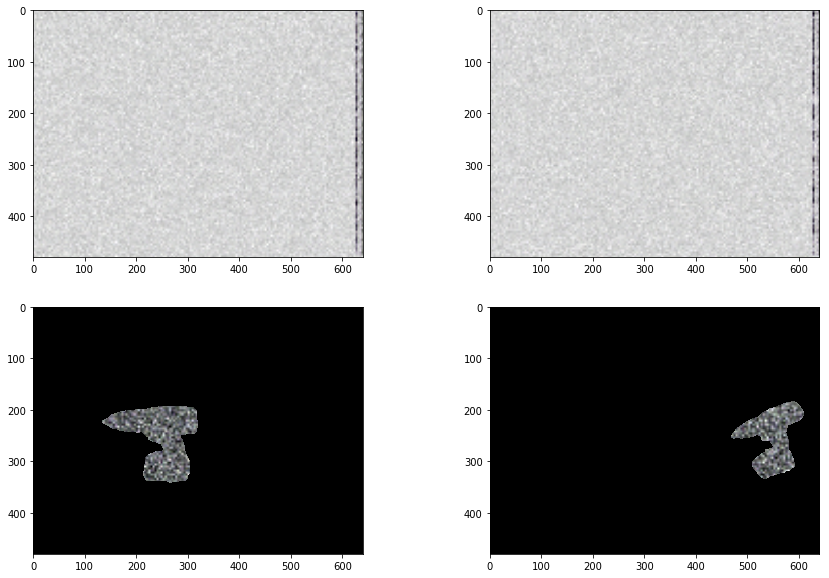



-----------Test Data Evaluation on gopro_box----------------
Image pair (867, 691)
Could not find descriptor image stats...
Only normalizing pairs of images!


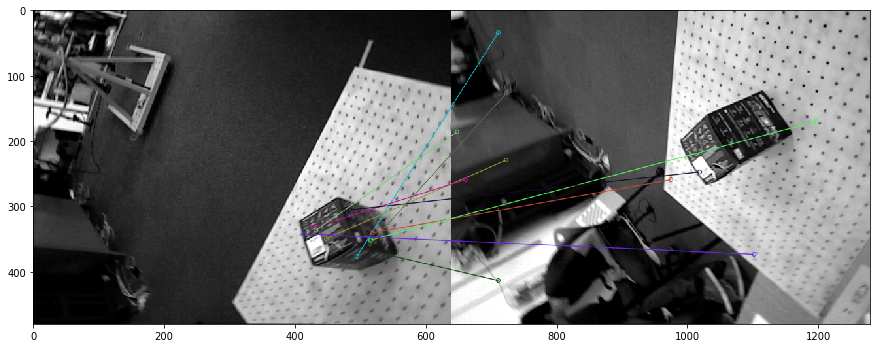

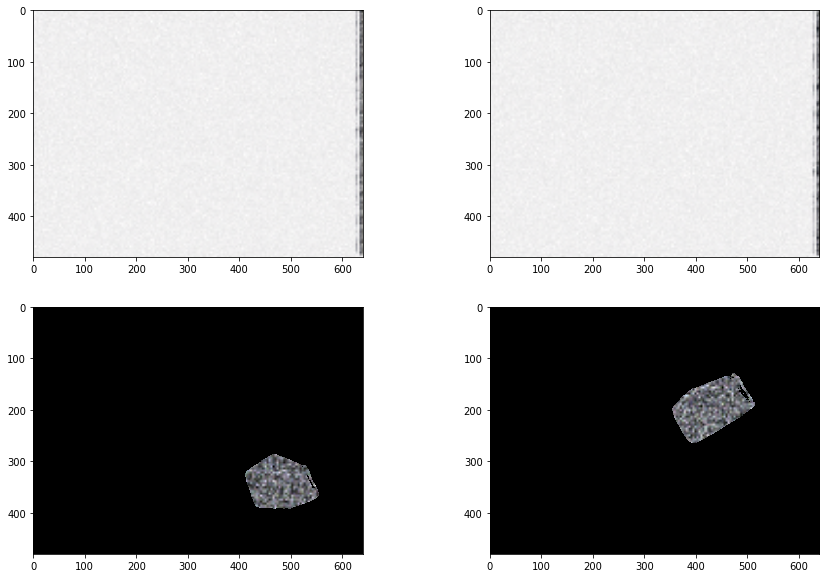



-----------Test Data Evaluation on headphones----------------
Image pair (3359, 3499)
Could not find descriptor image stats...
Only normalizing pairs of images!


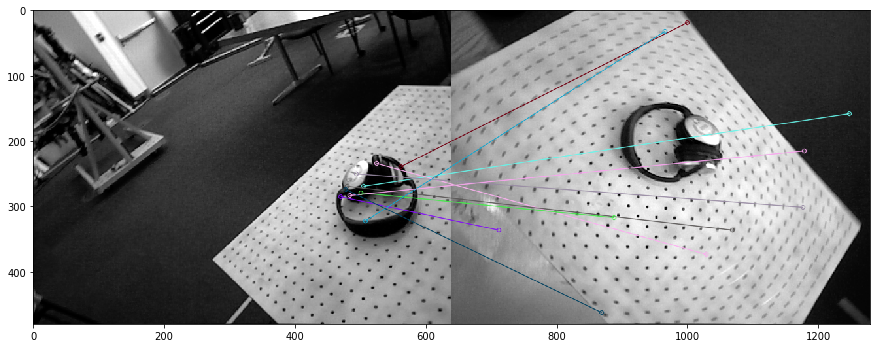

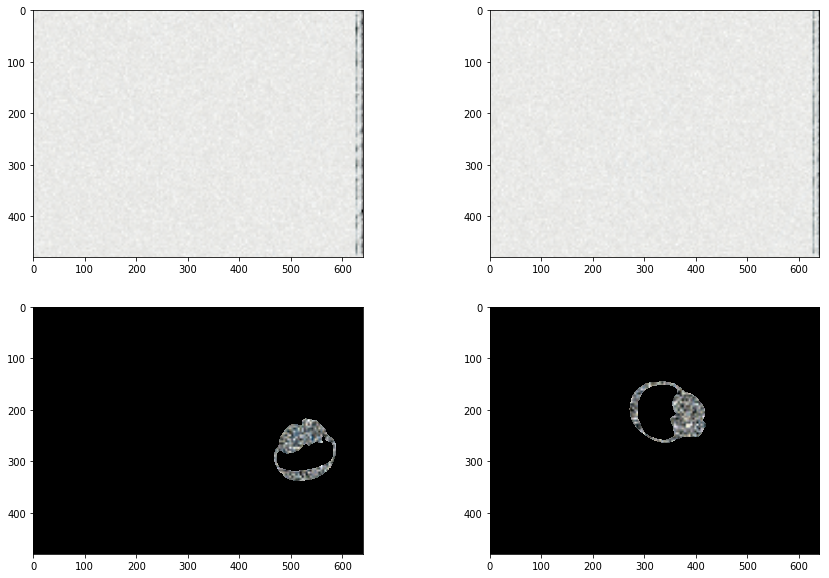

 58%|█████▊    | 2034/3500 [27:20<18:20,  1.33it/s]  

KeyboardInterrupt: 

In [4]:
# All of the saved data for this network will be located in the
# code/data/pdc/trained_models/tutorials/caterpillar_3 folder
print(train_config.keys())
print "training descriptor of dimension %d" %(d)
train = OPMultiDenseCorrespondenceTraining(config=train_config)
train.load_dataset_from_config(config=data_config)
train.run()
print "finished training descriptor of dimension %d" %(d)

# Each batch, select a random image from a random scene
# for that image, find another image from the same scene
# but a taken from a diff view.
# then generate both pixel matches and non-matches 
# yes there is a heuristic approach, but it seeems complex
# and thus runtime is long. Prune non-matches based on:
# 1. depth is 0 (thus invalid, cannot use)
# 2. Project pixels from im1 to onto im2 and check if outside FOV
# 3. check if pixel is occluded using some method
# complicated... don't touch

# Fine-tune on New Objects

In [ ]:
# New objects
# Datasets available:
# caterpillar_upright
# mugs
# shoes
# drills
config_filename = os.path.join(utils.getDenseCorrespondenceSourceDir(), 'config', 'dense_correspondence', 
                               'dataset', 'composite', 'finetune.yaml')
finetune_config = utils.getDictFromYamlFilename(config_filename)
finetune_config['logs_root_path'] = '/home/ashek/code/data/pdc/logs_proto'
finetune_dataset = SpartanDataset(config=finetune_config)
print(json.dumps(finetune_config, indent=2))

In [ ]:
num_iterations = 1500
d = 3 # the descriptor dimension
train_config["training"]["num_iterations"] = num_iterations
print(json.dumps(train_config, indent=2))

In [ ]:
model_folder = os.path.join(logging_dir, name)
model_folder = utils.convert_data_relative_path_to_absolute_path(model_folder)
print("Loading %s" % model_folder)
iteration = 3501
print "training descriptor of dimension %d" %(d)
finetune = DenseCorrespondenceTraining(dataset=finetune_dataset, config=train_config)
finetune.run_from_pretrained(model_folder, iteration)
print "finished training descriptor of dimension %d" %(d)

In [ ]:
!ls /home/ashek/code/data/pdc/trained_models/tutorials/caterpillar_3

## Evaluate the network quantitatively

This should take ~5 minutes.

In [ ]:
# Evaluate initial model (no fine-tuning) on original train dataset
DCE = DenseCorrespondenceEvaluation
iteration = 3501
num_image_pairs = 100
save_folder_name = "analysis"
DCE.run_evaluation_on_network(model_folder, iteration=iteration, num_image_pairs=num_image_pairs,
                             dataset=dataset, save_folder_name=save_folder_name)      

In [ ]:
# Evaluate fine-tuned model on original train dataset
iteration = 5002
num_image_pairs = 100
save_folder_name = "finetune_analysis_orig_data"
DCE.run_evaluation_on_network(model_folder, iteration=iteration, num_image_pairs=num_image_pairs,
                             dataset=dataset, save_folder_name=save_folder_name)         

In [ ]:
# Evaluate fine-tuned model on new finetuned dataset
DCE = DenseCorrespondenceEvaluation
iteration = 5002
num_image_pairs = 100
save_folder_name = "finetune_analysis_finetune_data"
DCE.run_evaluation_on_network(model_folder, iteration=iteration, num_image_pairs=num_image_pairs,
                             dataset=finetune_dataset, save_folder_name=save_folder_name)      

See `evaluation_quantitative_tutorial.ipynb` for a better place to display the plots.

In [ ]:
# Finetune on 2nd additional dataset just to emphasize issue further
config_filename = os.path.join(utils.getDenseCorrespondenceSourceDir(), 'config', 'dense_correspondence', 
                               'dataset', 'composite', 'finetune2.yaml')
finetune2_config = utils.getDictFromYamlFilename(config_filename)
finetune2_config['logs_root_path'] = '/home/ashek/code/data/pdc/logs_proto'
finetune2_dataset = SpartanDataset(config=finetune_config)
print(json.dumps(finetune2_config, indent=2))

In [ ]:
model_folder = os.path.join(logging_dir, name)
model_folder = utils.convert_data_relative_path_to_absolute_path(model_folder)
print("Loading %s" % model_folder)
iteration = 5002
print "training descriptor of dimension %d" %(d)
finetune2 = DenseCorrespondenceTraining(dataset=finetune2_dataset, config=train_config)
finetune2.run_from_pretrained(model_folder, iteration)
print "finished training descriptor of dimension %d" %(d)

In [ ]:
# Evaluate fine-tuned2 model on new finetuned2 dataset
DCE = DenseCorrespondenceEvaluation
iteration = 6503
num_image_pairs = 100
save_folder_name = "finetune2_analysis_finetune_data2"
DCE.run_evaluation_on_network(model_folder, iteration=iteration, num_image_pairs=num_image_pairs,
                             dataset=finetune2_dataset, save_folder_name=save_folder_name)      

In [ ]:
# Evaluate fine-tuned model on original train dataset
iteration = 6503
num_image_pairs = 100
save_folder_name = "finetune2_analysis_orig_data"
DCE.run_evaluation_on_network(model_folder, iteration=iteration, num_image_pairs=num_image_pairs,
                             dataset=dataset, save_folder_name=save_folder_name)         